# CellPin: `fit()` vs `match_emb()` — a clear comparison

This notebook compares three embedding strategies on the same scRNA + spatial dataset:

| | Method | Key idea |
|---|---|---|
| **A** | `model.fit()` | Two-stage VAE: pretrain on full scRNA, distil to panel encoder |
| **B** | `model.match_emb()` | Train a small network to directly reproduce an existing atlas embedding (e.g. scVI / scANVI) |
| **C** | `model.match_emb()` + `finetune_spatial()` | Same as B, then close the scRNA→spatial domain gap with MMD |

We compare on three axes:
1. **UMAP structure** — visual inspection of spatial cell types
2. **Label-transfer accuracy** — kNN classifier on held-out scRNA (`model.tl.label_transfer`, built-in)
3. **Co-embedding** — scRNA + spatial in a shared atlas space (grand finale, B/C only)

## 0. Setup

In [1]:
def sample_square_from_center(adata, target_cells=50_000, coord_key="spatial"):
    """Crop a square patch centred on a random cell until we have target_cells."""
    coords = adata.obsm[coord_key]
    center = coords[np.random.randint(coords.shape[0])]
    x0, y0 = center
    d = 100
    while True:
        mask = (
            (coords[:, 0] >= x0 - d) & (coords[:, 0] <= x0 + d) &
            (coords[:, 1] >= y0 - d) & (coords[:, 1] <= y0 + d)
        )
        if mask.sum() >= target_cells:
            break
        d *= 1.2
    return adata[mask].copy()

In [2]:
import cellpin
import torch
import anndata as ad
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from time import time

sc.settings.set_figure_params(dpi=100, frameon=False)

## 1. Load data

- `sc_adata`: single-cell reference atlas — raw counts in `.X` or a named layer, plus a precomputed atlas embedding (e.g. scANVI).
- `sp_adata`: spatial dataset — raw counts, panel genes only.

Here we use the **HCLA core atlas** (https://data.humancellatlas.org/hca-bio-networks/lung/atlases/lung-v1-0, 4k HVG)  
and a **Lung Xenium** sample from 10X (https://www.10xgenomics.com/datasets/xenium-human-lung-preview-data-1-standard).  
Update the paths below for your own data.

In [3]:
LAYER         = "counts"       # layer with raw integer counts; None → use .X
CELL_TYPE_COL = "ann_level_3" # column in sc_adata.obs with cell type labels
ATLAS_EMB_KEY = "X_scanvi_emb" # obsm key of the precomputed atlas embedding in sc_adata

sc_adata = sc.read_h5ad("/mnt/storage/jepa_data/scRNA/Lung/HCLA_core/4cb45d80-499a-48ae-a056-c71ac3552c94_hvg4000.h5ad")

# This atlas stores raw counts in .raw; copy to a layer
sc_data_counts = sc_adata.raw[sc_adata.obs_names, sc_adata.var_names]
sc_adata.layers["counts"] = sc_data_counts.X
sc_adata.var_names = sc_adata.var["feature_name"]  # align var_names with spatial
sc.pp.subsample(sc_adata, n_obs=250_000, random_state=0)

sp_adata = sc.read_h5ad("/mnt/storage/philipp/context_paint_benchmark/spatial/10X_Xenium/Lung_none_diseased/processed_sampleLung_10X_BC.h5ad")
sc.pp.filter_cells(sp_adata, min_genes=10)
sp_adata = sample_square_from_center(sp_adata, target_cells=50_000)

print(f"scRNA: {sc_adata.n_obs:,} cells × {sc_adata.n_vars:,} genes")
print(f"Spatial: {sp_adata.n_obs:,} cells")

/environments/philipp.putze/micromamba/envs/match_atlas/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)


scRNA: 250,000 cells × 4,000 genes
Spatial: 59,046 cells


## 2. Setup datasets

`cellpin.pp.setup_data` aligns panel genes, normalises, and returns dataset objects used by all training methods.

In [4]:
sc_dataset, sp_dataset = cellpin.pp.setup_data(
    sc_adata, sp_adata,
    layer=LAYER,
    batch_key="dataset",
)

[cellpin.pp.setup] Setting up CellPin datasets


/environments/philipp.putze/micromamba/envs/match_atlas/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/environments/philipp.putze/micromamba/envs/match_atlas/lib/python3.11/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


[cellpin.pp.setup] sc_adata :  250,000 cells  ×    4,000 genes
[cellpin.pp.setup] st_adata :   59,046 cells  ×      392 spatial genes
[cellpin.pp.setup] Expression read from layer='counts'
[cellpin.pp.setup] WARNING: 156 spatial gene(s) not found in sc_adata — will be dropped:
  ['ACE', 'ACE2', 'ACTR3', 'ADAM17', 'ADGRE5', 'AIF1', 'AK1', 'ALDH1A3', 'ALOX5', 'ANAPC16'] ...
[cellpin.pp.setup] Panel    : 236 genes overlap (60.2% of spatial genes retained)
[cellpin.pp.setup] Imputed  : 4,000 genes total in sc space (3,764 genes to impute, not in panel)
[cellpin.pp.setup] sc_dataset: 250,000 cells, 4,000 genes total, 236 panel genes
[cellpin.pp.setup] st_dataset: 59,046 cells, 236 panel genes


---
# A) Standard CellPin — `model.fit()`

Two-stage training on the scRNA reference:
1. **Stage 1 — pretrain:** full-gene VAE (ELBO on all 4k reference genes)
2. **Stage 2 — distillation:** panel encoder aligned to the full encoder via MSE + SNN + reconstruction

The resulting embedding (`X_cellpin`) lives in the VAE latent space.

### A.1 — Train

In [6]:
t0 = time()
model_A = cellpin.CellPin(sc_dataset)
model_A.fit(
    sc_dataset,
    pretrain_epochs=50,
    train_epochs=60,
    batch_size=512,
    save_checkpoints=False,
    accelerator="gpu",
    devices=1,
)
time_A = time() - t0
print(f"A: training time = {time_A / 60:.1f} min")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

A: training time = 32.0 min


### A.2 — Loss curves

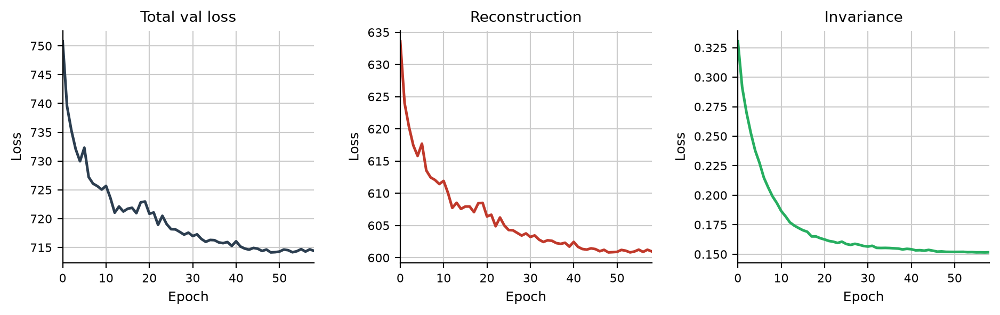

In [7]:
model_A.pl.losses()

### A.3 — Label transfer (kNN on scRNA embedding)

`model.tl.label_transfer` trains a kNN classifier on the scRNA embedding, evaluates on held-out scRNA,  
and transfers labels to the spatial cells. It auto-embeds any adata that doesn't have the key yet.

In [8]:
# label_transfer auto-detects X_cellpin (VAE path) and auto-embeds sc + sp if missing
acc_A, sp_adata = model_A.tl.label_transfer(sc_adata, CELL_TYPE_COL, sp_adata)
print(f"A) CellPin fit()  →  kNN accuracy on held-out scRNA: {acc_A:.4f}")

[label_transfer] Using embedding: X_cellpin
[label_transfer] X_cellpin not found in sc_adata — embedding with default settings...
Embedding and imputing cells (MC, 50 samples)...
[CellPin.impute] Panel gene order confirmed ✓
[label_transfer] X_cellpin not found in sp_adata — embedding with default settings...
Embedding and imputing cells (MC, 50 samples)...
[CellPin.impute] Panel gene order confirmed ✓

[label_transfer] 25 cell type classes
[label_transfer] Train: 200000 | Test: 50000
[label_transfer] Test accuracy: 0.9436
[label_transfer] Annotation complete. Annotations stored in sp_adata.obs['cellpin_annotation']
A) CellPin fit()  →  kNN accuracy on held-out scRNA: 0.9436


### A.4 — UMAP of spatial cells (VAE embedding)

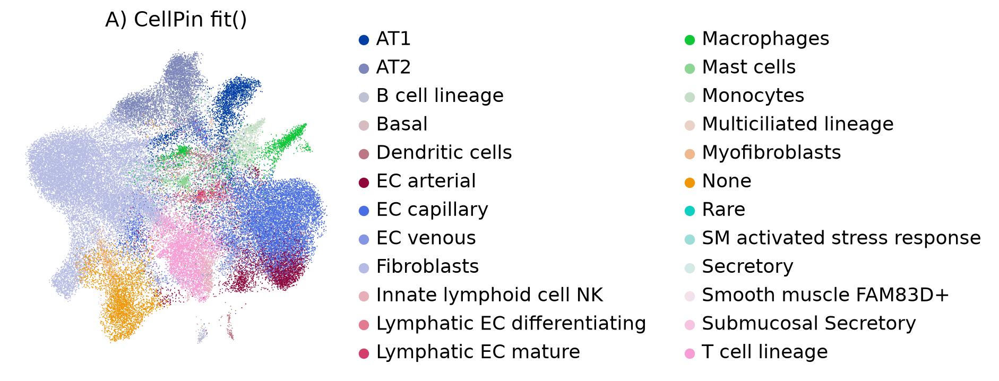

In [10]:
sc.pp.neighbors(sp_adata, use_rep="X_cellpin")
sc.tl.umap(sp_adata)
sp_adata.obsm["X_umap_A"] = sp_adata.obsm["X_umap"].copy()  # save for comparison

sc.pl.umap(sp_adata, color="cellpin_annotation",
           title="A) CellPin fit()",
           frameon=False)

---
# B) Atlas Matching — `model.match_emb()` (no fine-tune)

Skip the VAE entirely. A compact **AtlasMatchNet** is trained to map the spatial panel directly onto  
the precomputed scANVI embedding stored in `sc_adata.obsm[ATLAS_EMB_KEY]`.

The resulting embedding (`X_cellpin_match`) lives in the **same space as the original atlas** —  
so spatial cells become directly comparable to scRNA cells.

### B.1 — Build model

The config below is the recommended default (also the built-in default when no config is passed).

In [5]:
config = {
    # network architecture
    "atlas_hidden": 1024,
    "atlas_blocks": 8,
    "atlas_expansion": 2.0,
    "atlas_dropout": 0.1,
    "atlas_drop_path_rate": 0.1,
    # augmentation (simulate lower spatial capture efficiency)
    "poisson_resample_rate": 0.4,    # global batch-level count reduction
    "spatial_resample_rate": 0.85,   # per-cell count reduction (wider range)
    "panel_mixup_alpha": 0.3,        # intra-batch contamination mixup
    # loss weights
    "atlas_distill_weight": 1.0,
    "atlas_consistency_weight": 1.0,
    "atlas_cos_weight": 0.1,
    # training schedule
    "atlas_aug_warmup_frac": 0.10,   # 10% epochs with no augmentation before ramping
    "atlas_lr_warmup_epochs": 5,     # linear LR warmup before cosine decay
    "atlas_ema_decay": 0.999,
}

model_B = cellpin.CellPin(sc_dataset, config=config)

### B.2 — Train atlas-matching network

In [6]:
t0 = time()
model_B.match_emb(
    sc_dataset,
    emb_key=ATLAS_EMB_KEY,
    train_epochs=60,
    batch_size=1024,
    early_stopping_patience=20,
    checkpoint_monitor="val_knn_overlap",
    early_stopping_mode="max",
    accelerator="gpu",
    devices=1,
)
time_B = time() - t0
print(f"B: training time = {time_B / 60:.1f} min")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

B: training time = 6.7 min


### B.3 — Loss curves

Key metrics to watch: `val_r2_mean` (per-dim R² in atlas space) and `val_knn_overlap` (neighbour structure preservation).

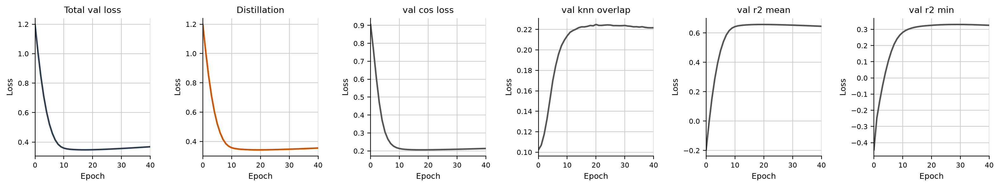

In [8]:
model_B.pl.losses(keys="all")

### B.4 — Embed spatial cells + label transfer

`label_transfer` auto-detects the atlas path (because `model_B.atlas_net` is set) and uses `X_cellpin_match`  
as the embedding key. It auto-embeds both sc_adata and sp_adata if the key is missing.

In [9]:
# Embed spatial cells into atlas space (X_cellpin_match is the default key for match_emb)
sp_dl = torch.utils.data.DataLoader(sp_dataset, batch_size=512, shuffle=False, num_workers=4)
sp_adata.obsm["X_cellpin_match"] = model_B.embed_atlas(sp_dl)

# label_transfer auto-detects X_cellpin_match, auto-embeds sc_adata via atlas_net
acc_B, sp_adata = model_B.tl.label_transfer(sc_adata, CELL_TYPE_COL, sp_adata)
print(f"B) match_emb (no finetune)  →  kNN accuracy on held-out scRNA: {acc_B:.4f}")

Output()

Output()

[label_transfer] Using embedding: X_cellpin_match
[label_transfer] X_cellpin_match not found in sc_adata — embedding via atlas network...



[label_transfer] 25 cell type classes
[label_transfer] Train: 200000 | Test: 50000
[label_transfer] Test accuracy: 0.9221
[label_transfer] Annotation complete. Annotations stored in sp_adata.obs['cellpin_annotation']
B) match_emb (no finetune)  →  kNN accuracy on held-out scRNA: 0.9221


### B.5 — UMAP of spatial cells (atlas embedding)

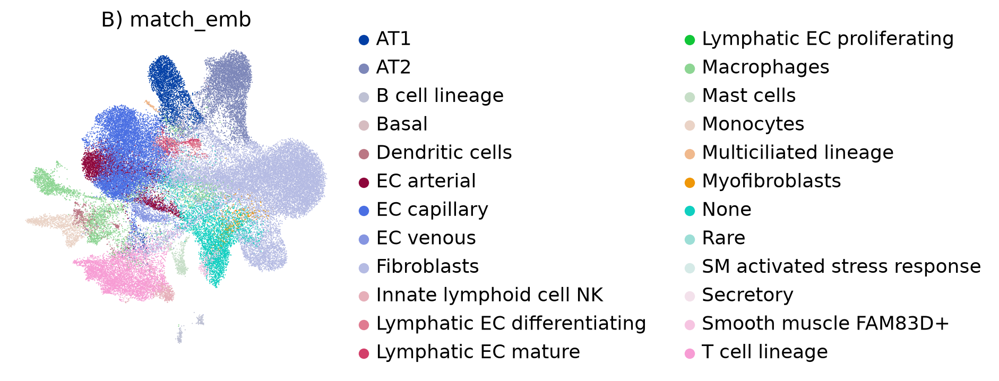

In [10]:
sc.pp.neighbors(sp_adata, use_rep="X_cellpin_match")
sc.tl.umap(sp_adata)
sp_adata.obsm["X_umap_B"] = sp_adata.obsm["X_umap"].copy()

sc.pl.umap(sp_adata, color="cellpin_annotation",
           title="B) match_emb",
           frameon=False)

---
# C) Atlas Matching + Fine-tune — `model.finetune_spatial()`

Continue from model B: fine-tune the atlas network to close the **scRNA → spatial domain gap**.  
Each training batch mixes scRNA and spatial cells:

- **scRNA cells** are anchored to their fixed atlas targets (prevent drift)
- **Spatial cells** are pulled toward the scRNA distribution via MMD

### C.1 — Fine-tune spatial

In [11]:
t0 = time()
model_B.finetune_spatial(
    sc_dataset,
    sp_dataset,
    train_epochs=30,
    batch_size=1024,
    early_stopping_patience=10,
    accelerator="gpu",
    devices=1,
)
time_C = time() - t0
print(f"C: fine-tune time = {time_C / 60:.1f} min")

  [finetune_spatial] No type labels provided — falling back to MMD.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/environments/philipp.putze/micromamba/envs/match_atlas/lib/python3.11/site-packages/pytorch_lightning/loops/fit_loop.py:538: Found 383 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If this is intentional, you can ignore this warning.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

C: fine-tune time = 5.9 min


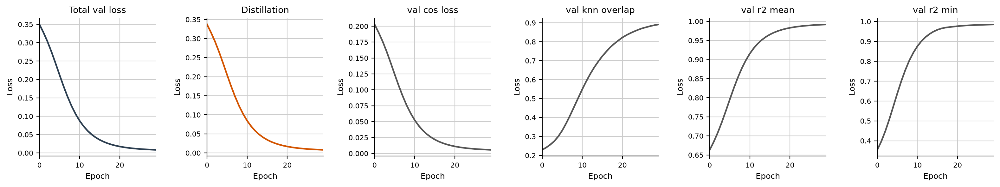

In [12]:
model_B.pl.losses(keys="all")

### C.2 — Re-embed spatial + label transfer

In [13]:
sp_adata.obsm["X_cellpin_match_ft"] = model_B.embed_atlas(sp_dl)

# For label_transfer we temporarily store the fine-tuned embedding under X_cellpin_match
# so the classifier uses it; save pre-finetune embedding first
sp_adata.obsm["X_cellpin_match_noft"] = sp_adata.obsm["X_cellpin_match"].copy()
sp_adata.obsm["X_cellpin_match"] = sp_adata.obsm["X_cellpin_match_ft"]

# Re-embed scRNA through the fine-tuned network so the classifier uses the same net
if "X_cellpin_match" in sc_adata.obsm:
    del sc_adata.obsm["X_cellpin_match"]  # force re-embedding through fine-tuned weights

acc_C, sp_adata = model_B.tl.label_transfer(sc_adata, CELL_TYPE_COL, sp_adata)
print(f"C) match_emb + finetune  →  kNN accuracy on held-out scRNA: {acc_C:.4f}")

Output()

Output()

[label_transfer] Using embedding: X_cellpin_match
[label_transfer] X_cellpin_match not found in sc_adata — embedding via atlas network...



[label_transfer] 25 cell type classes
[label_transfer] Train: 200000 | Test: 50000
[label_transfer] Test accuracy: 0.9423
[label_transfer] Annotation complete. Annotations stored in sp_adata.obs['cellpin_annotation']
C) match_emb + finetune  →  kNN accuracy on held-out scRNA: 0.9423


### C.3 — UMAP of spatial cells (fine-tuned atlas embedding)

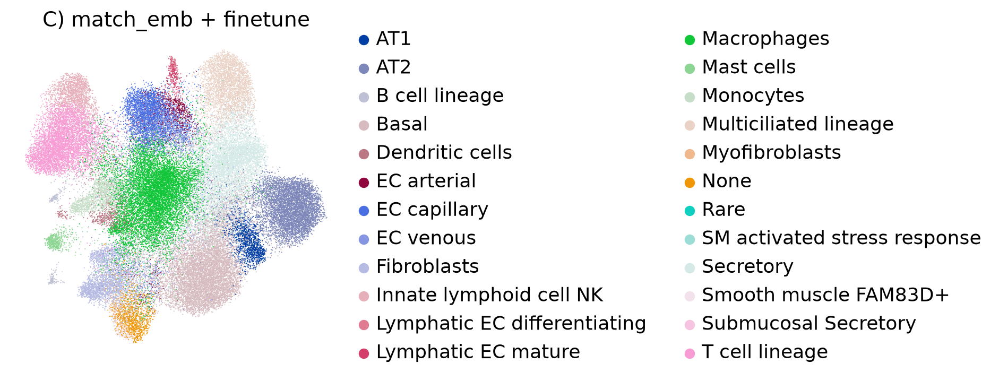

In [14]:
sc.pp.neighbors(sp_adata, use_rep="X_cellpin_match")
sc.tl.umap(sp_adata)
sp_adata.obsm["X_umap_C"] = sp_adata.obsm["X_umap"].copy()

sc.pl.umap(sp_adata, color="cellpin_annotation",
           title="C) match_emb + finetune",
           frameon=False)

### Summary: accuracy comparison

In [ ]:
# ── Accuracy table ──────────────────────────────────────────────────────────
print("\n=== Label-transfer kNN accuracy on held-out scRNA ===")
print(f"  A) CellPin fit()                  : {acc_A:.4f}")
print(f"  B) match_emb (no finetune)        : {acc_B:.4f}")
print(f"  C) match_emb + finetune_spatial   : {acc_C:.4f}")


---
# D) Grand Finale: Co-embedding of scRNA + Spatial

Because `match_emb` maps spatial cells into the **same space as the scRNA atlas**,  
we can directly concatenate both datasets and compute a joint UMAP.

- **scRNA cells** use their ground-truth `X_scanvi_emb` (the atlas)
- **Spatial cells** use `X_cellpin_match` (the fine-tuned predicted atlas embedding)

A well-trained match_emb network should mix scRNA and spatial cells of the same type,  
with no visible batch effect between the two modalities.

In [15]:
# Align to a shared obsm key so ad.concat keeps it
sc_adata.obsm["X_coembedding"] = sc_adata.obsm[ATLAS_EMB_KEY].copy()
sp_adata.obsm["X_coembedding"] = sp_adata.obsm["X_cellpin_match"].copy()  # fine-tuned

# Mark cell type for scRNA; spatial uses the transferred label
sc_adata.obs["plot_label"] = sc_adata.obs[CELL_TYPE_COL].astype(str)
sp_adata.obs["plot_label"] = sp_adata.obs["cellpin_annotation"].astype(str)

combined = ad.concat(
    {"scRNA": sc_adata, "spatial": sp_adata},
    join="inner",
    label="source",
)
print(f"Combined: {combined.n_obs:,} cells (scRNA + spatial)")
print(f"X_coembedding shape: {combined.obsm['X_coembedding'].shape}")

Combined: 309,046 cells (scRNA + spatial)
X_coembedding shape: (309046, 30)


/tmp/ipykernel_174703/4092627345.py:9: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  combined = ad.concat(


In [16]:
sc.pp.neighbors(combined, use_rep="X_coembedding", n_neighbors=30)
sc.tl.umap(combined)

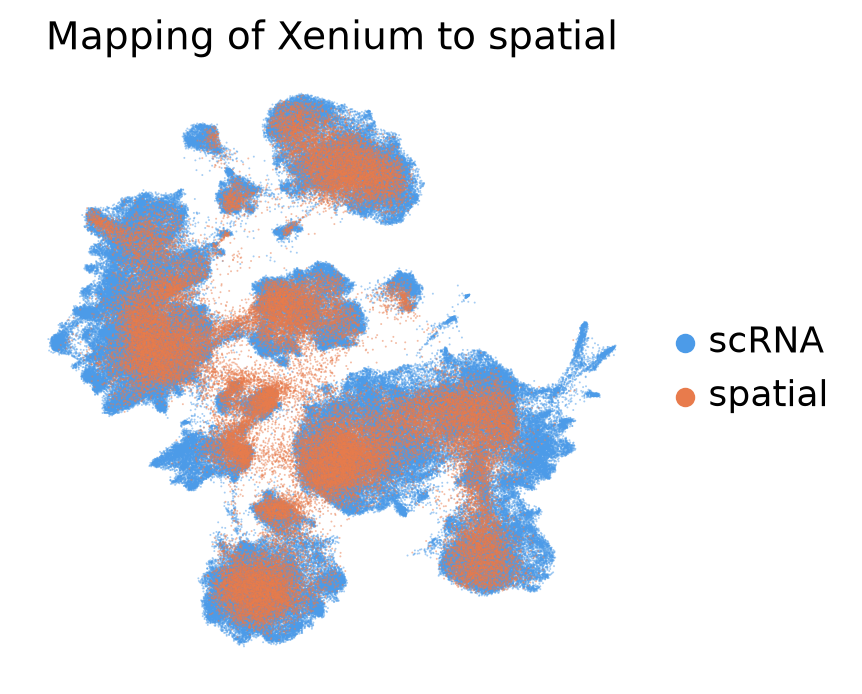

In [19]:
# Colour by data source: do scRNA and spatial cells intermix?
sc.pl.umap(
    combined,
    color="source",
    palette={"scRNA": "#4C9BE8", "spatial": "#E87B4C"},
    title="Mapping of Xenium to spatial",
    frameon=False,
    size=2,
    alpha=0.5,
)

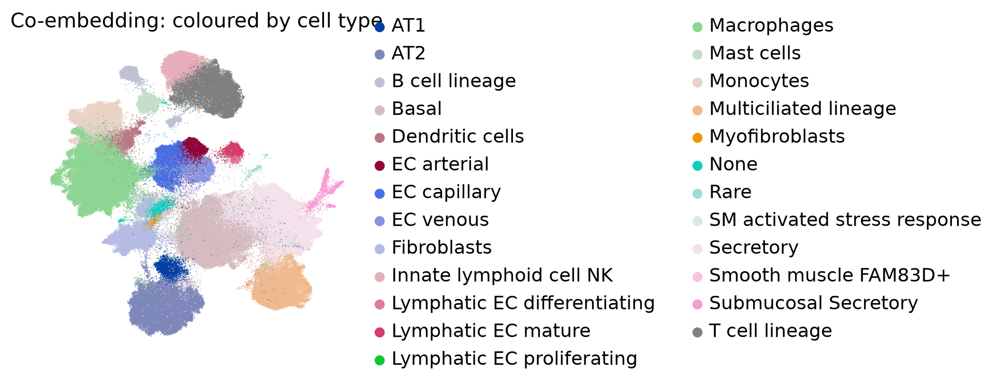

In [20]:
# Colour by cell type: cells from both modalities should cluster together
sc.pl.umap(
    combined,
    color="plot_label",
    title="Co-embedding: coloured by cell type",
    frameon=False,
    size=2,
)

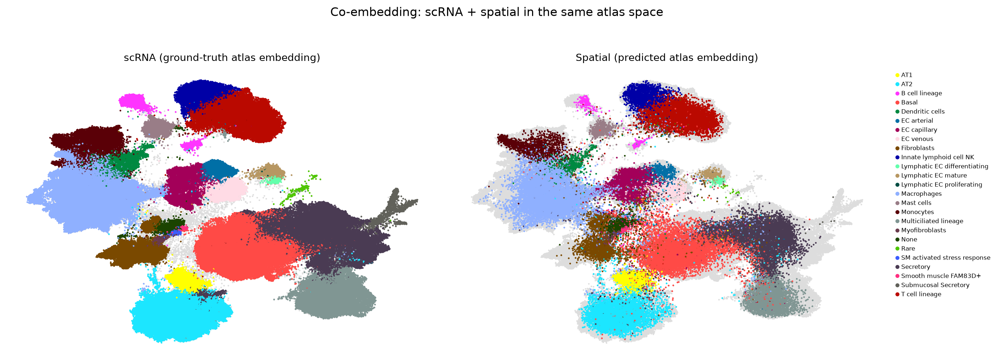

In [21]:
# Split view: same UMAP, scRNA and spatial separately coloured
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

umap = combined.obsm["X_umap"]
is_sc = combined.obs["source"] == "scRNA"
is_sp = combined.obs["source"] == "spatial"

# Build a colour palette from the combined cell type labels
all_labels = combined.obs["plot_label"].values
cats = sorted(set(all_labels))
palette = dict(zip(cats, sc.pl.palettes.default_102[:len(cats)]))
colors = np.array([palette[l] for l in all_labels])

for ax, mask, title in [
    (axes[0], is_sc,  "scRNA (ground-truth atlas embedding)"),
    (axes[1], is_sp, "Spatial (predicted atlas embedding)"),
]:
    # Grey background: all cells
    ax.scatter(umap[:, 0], umap[:, 1], c="#DDDDDD", s=0.3, rasterized=True)
    # Coloured foreground: target modality
    ax.scatter(umap[mask, 0], umap[mask, 1], c=colors[mask], s=0.5, rasterized=True)
    ax.set_title(title, fontsize=10)
    ax.axis("off")

handles = [plt.Line2D([0], [0], marker="o", color="w", markerfacecolor=palette[c],
                      markersize=5, label=c) for c in cats]
axes[1].legend(handles=handles, bbox_to_anchor=(1.02, 1), loc="upper left",
               fontsize=6, frameon=False)
plt.suptitle("Co-embedding: scRNA + spatial in the same atlas space", fontsize=12, y=1.01)
plt.tight_layout()
plt.show()

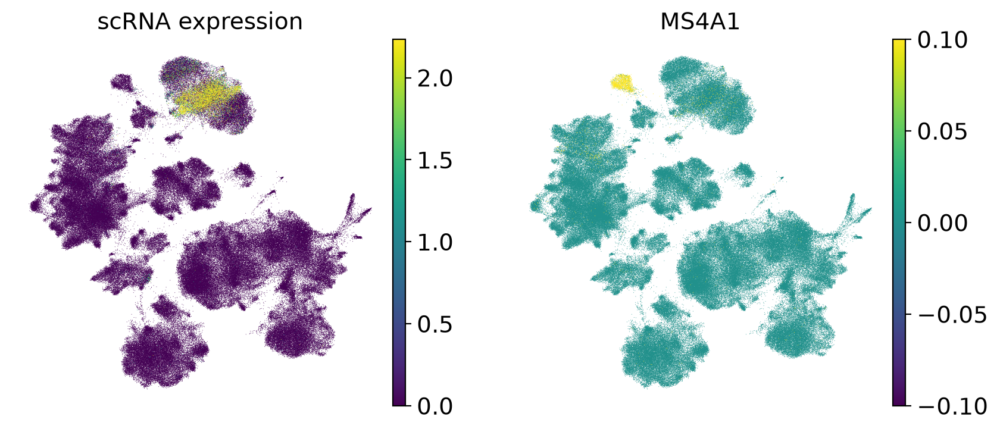

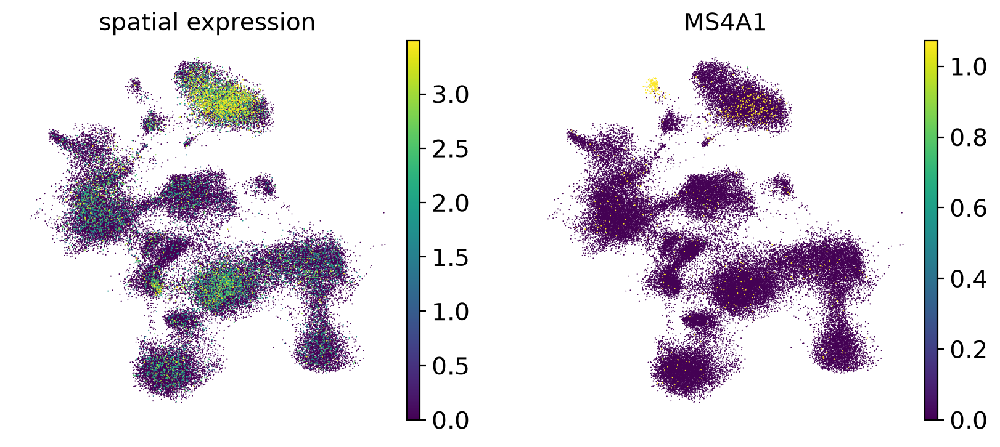

In [22]:
sc.pl.umap(combined[combined.obs["source"]=="scRNA"],color=["CD8A", "MS4A1"],title="scRNA expression",vmax="p99")

sc.pl.umap(combined[combined.obs["source"]=="spatial"],color=["CD8A", "MS4A1"],title="spatial expression",vmax="p99")



/home/philipp.putze/micromamba/envs/match_atlas/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/philipp.putze/micromamba/envs/match_atlas/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/philipp.putze/micromamba/envs/match_atlas/lib/python3.11/site-packages/scanpy/t

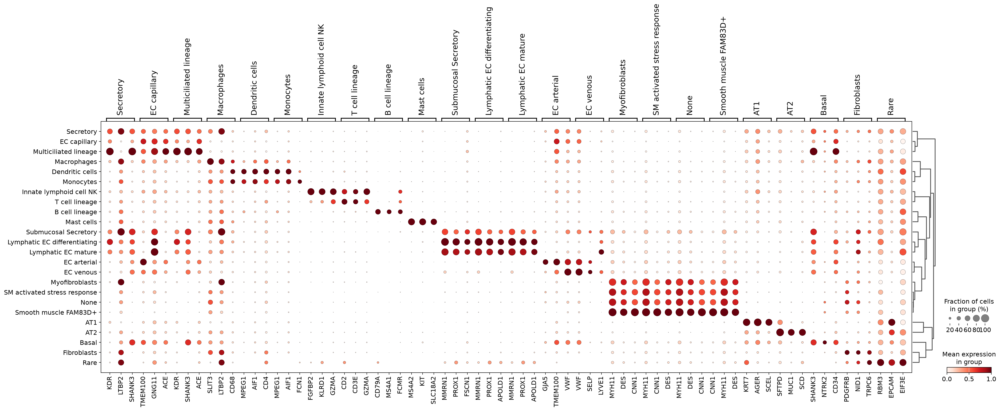

In [44]:
sc.tl.rank_genes_groups(sp_adata,groupby="cellpin_annotation",layer="log1p_norm",method="wilcoxon")

sc.pl.rank_genes_groups_dotplot(sp_adata,groupby="cellpin_annotation", n_genes=3,standard_scale="var")

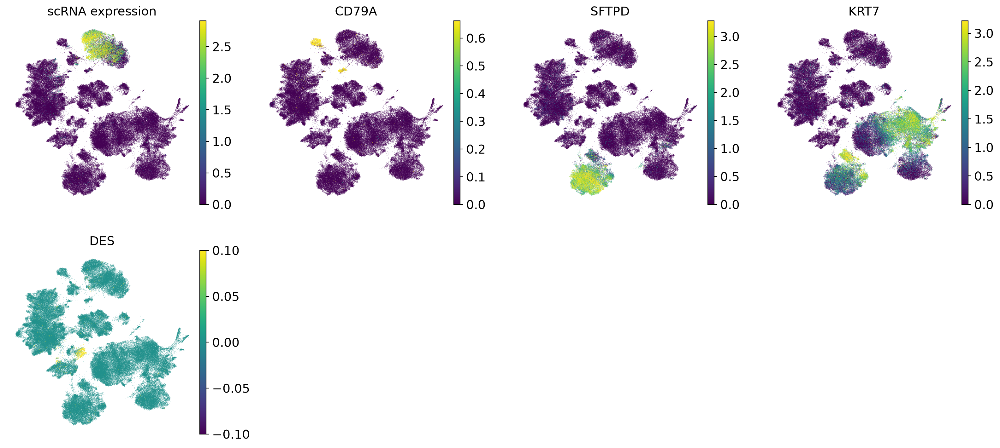

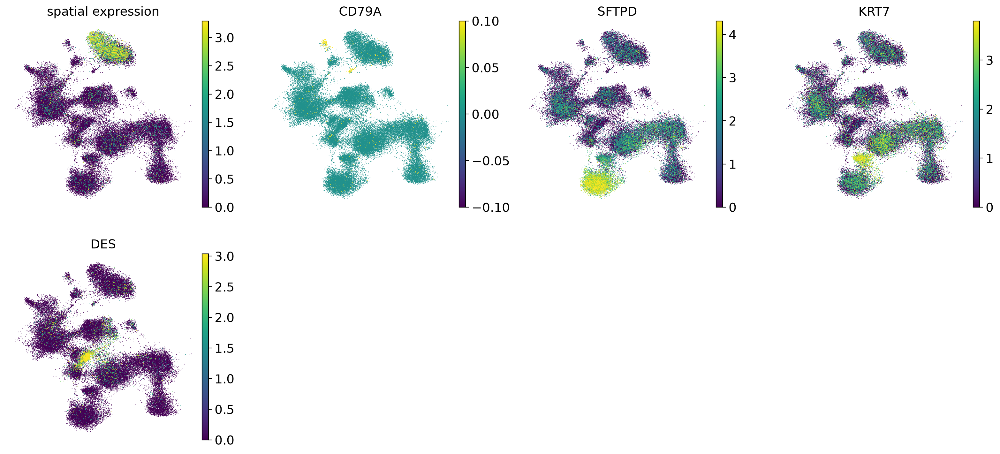

In [23]:
sc.pl.umap(combined[combined.obs["source"]=="scRNA"],color=["GZMA", "CD79A","SFTPD","KRT7","DES"],title="scRNA expression",vmax="p99")

sc.pl.umap(combined[combined.obs["source"]=="spatial"],color=["GZMA", "CD79A","SFTPD","KRT7","DES"],title="spatial expression",vmax="p99")


/tmp/ipykernel_174703/2977770212.py:9: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  combined_noft = ad.concat(


Combined: 309,046 cells (scRNA + spatial)
X_coembedding shape: (309046, 30)


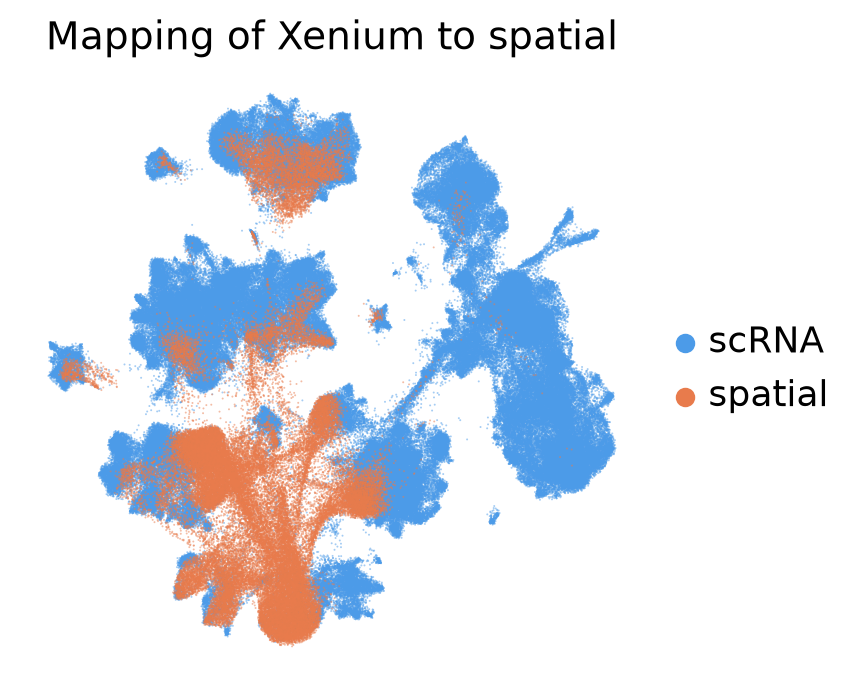

In [24]:
# Align to a shared obsm key so ad.concat keeps it
sc_adata.obsm["X_coembedding_no_fine"] = sc_adata.obsm[ATLAS_EMB_KEY].copy()
sp_adata.obsm["X_coembedding_no_fine"] = sp_adata.obsm["X_cellpin_match_noft"].copy()  # fine-tuned

# Mark cell type for scRNA; spatial uses the transferred label
sc_adata.obs["plot_label"] = sc_adata.obs[CELL_TYPE_COL].astype(str)
sp_adata.obs["plot_label"] = sp_adata.obs["cellpin_annotation"].astype(str)

combined_noft = ad.concat(
    {"scRNA": sc_adata, "spatial": sp_adata},
    join="inner",
    label="source",
)
print(f"Combined: {combined_noft.n_obs:,} cells (scRNA + spatial)")
print(f"X_coembedding shape: {combined_noft.obsm['X_coembedding_no_fine'].shape}")

sc.pp.neighbors(combined_noft, use_rep="X_coembedding_no_fine", n_neighbors=30)
sc.tl.umap(combined_noft)

# Colour by data source: do scRNA and spatial cells intermix?
sc.pl.umap(
    combined_noft,
    color="source",
    palette={"scRNA": "#4C9BE8", "spatial": "#E87B4C"},
    title="Mapping of Xenium to spatial",
    frameon=False,
    size=2,
    alpha=0.5,
)


In [27]:
combined_noft

AnnData object with n_obs × n_vars = 309046 × 236
    obs: 'plot_label', 'source'
    uns: 'neighbors', 'umap', 'source_colors'
    obsm: 'X_cellpin_match', 'X_umap', 'X_coembedding', 'X_coembedding_no_fine'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

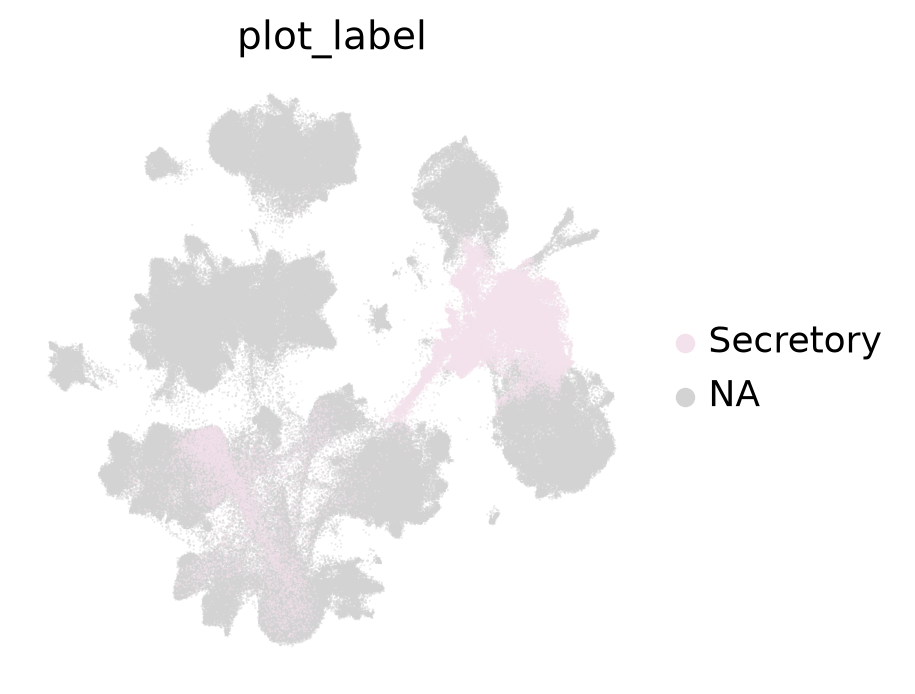

In [31]:
# Colour by data source: do scRNA and spatial cells intermix?
sc.pl.umap(
    combined_noft,
    color="plot_label",
    groups=["Secretory"],
    frameon=False,
    size=2,
    alpha=0.5,
)


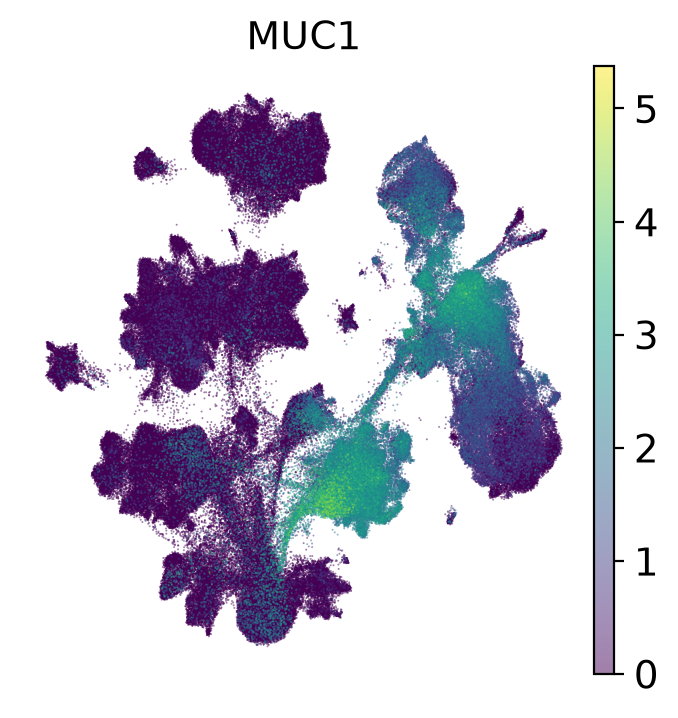

In [38]:
# Colour by data source: do scRNA and spatial cells intermix?
sc.pl.umap(
    combined_noft,
    color="MUC1",
    groups=["Secretory"],
    frameon=False,
    size=2,
    alpha=0.5,
)

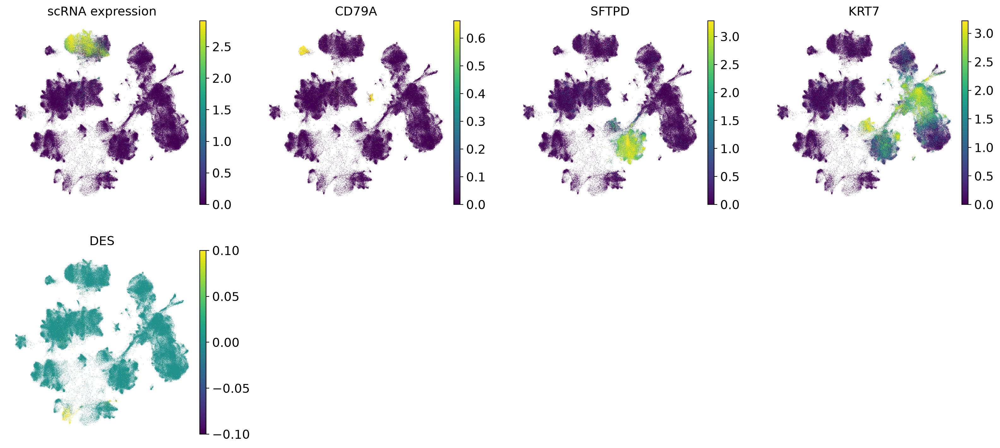

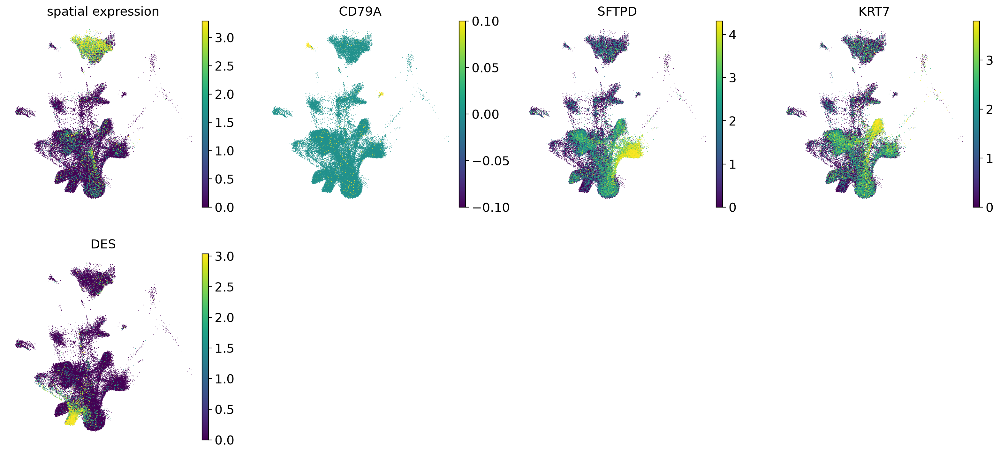

In [25]:
sc.pl.umap(combined_noft[combined_noft.obs["source"]=="scRNA"],color=["GZMA", "CD79A","SFTPD","KRT7","DES"],title="scRNA expression",vmax="p99")

sc.pl.umap(combined_noft[combined_noft.obs["source"]=="spatial"],color=["GZMA", "CD79A","SFTPD","KRT7","DES"],title="spatial expression",vmax="p99")

/tmp/ipykernel_60655/1081195650.py:9: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  combined_fit = ad.concat(


Combined: 309,046 cells (scRNA + spatial)
X_coembedding shape: (309046, 192)


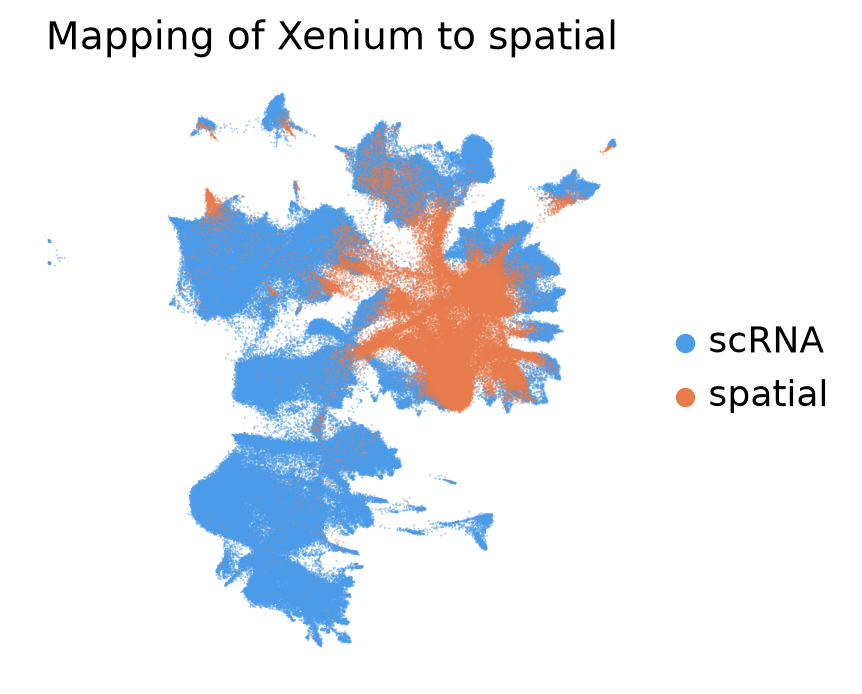

In [48]:
# Align to a shared obsm key so ad.concat keeps it
sc_adata.obsm["X_coembedding_fit"] = sc_adata.obsm["X_cellpin"].copy()
sp_adata.obsm["X_coembedding_fit"] = sp_adata.obsm["X_cellpin"].copy()  # fine-tuned

# Mark cell type for scRNA; spatial uses the transferred label
sc_adata.obs["plot_label"] = sc_adata.obs[CELL_TYPE_COL].astype(str)
sp_adata.obs["plot_label"] = sp_adata.obs["cellpin_annotation"].astype(str)

combined_fit = ad.concat(
    {"scRNA": sc_adata, "spatial": sp_adata},
    join="inner",
    label="source",
)
print(f"Combined: {combined_fit.n_obs:,} cells (scRNA + spatial)")
print(f"X_coembedding shape: {combined_fit.obsm['X_coembedding_fit'].shape}")

sc.pp.neighbors(combined_fit, use_rep="X_coembedding_fit", n_neighbors=30)
sc.tl.umap(combined_fit)

# Colour by data source: do scRNA and spatial cells intermix?
sc.pl.umap(
    combined_fit,
    color="source",
    palette={"scRNA": "#4C9BE8", "spatial": "#E87B4C"},
    title="Mapping of Xenium to spatial",
    frameon=False,
    size=2,
    alpha=0.5,
)

/tmp/ipykernel_60655/248861729.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(sp_adata,color="cellpin_annotation",spot_size=20)


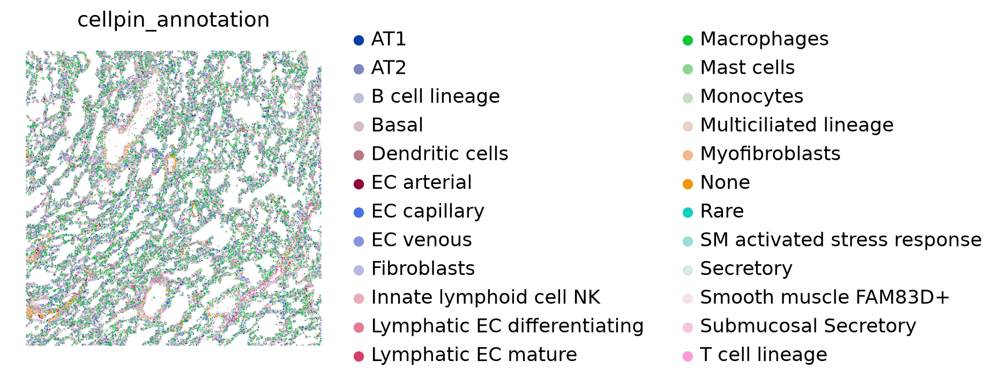

In [50]:
sc.pl.spatial(sp_adata,color="cellpin_annotation",spot_size=20)